In [1]:
from glob import glob
import sys
import getpass
import os
# import psutil
from os.path import join, exists
from os.path import getsize
import pickle
import numpy as np
import pandas as pd
import scipy
from scipy.stats import rankdata
import statannot

from tqdm import tqdm

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
%matplotlib inline
import seaborn as sns
import statsmodels.stats.multitest
# from statsmodels.sandbox.stats.multicomp import multipletests

# import nilearn.masking
from nilearn import plotting as nplt
from nilearn import image as niimg
from nilearn.input_data import NiftiLabelsMasker
# from nilearn.regions import connected_label_regions
from nilearn.connectome import ConnectivityMeasure
import nilearn.decoding

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import cross_validate
from sklearn.model_selection import GroupKFold
from sklearn.preprocessing import StandardScaler
# from sklearn.svm import LinearSVC

/home/sungbeenpark/anaconda3/envs/GA/lib/python3.9/site-packages/nilearn/datasets/__init__.py:86: FutureWarning: Fetchers from the nilearn.datasets module will be updated in version 0.9 to return python strings instead of bytes and Pandas dataframes instead of Numpy arrays.
  warn("Fetchers from the nilearn.datasets module will be "


In [2]:
## experimental properties
list_subj = ['01', '02', '05', '07', '08', '11', '12', '13', '14', '15'
             ,'18', '19', '20', '21', '23', '26', '27', '28', '29', '30'
             ,'31', '32', '33', '34', '35', '36', '37', '38', '42', '44']
list_stage = ['early_practice', 'early_unpractice', 'late_practice', 'late_unpractice']
list_run = ['r%02d'%(r+1) for r in range(6)]

In [3]:
dir_fmri = '/mnt/sda2/GA/fmri_data/'

---

로컬 메모리 상의 기준보다 크기가 큰 변수와 그 크기를 보여줌

In [4]:
import sys

def sizeof_fmt(num, suffix='B'):
    ''' by Fred Cirera,  https://stackoverflow.com/a/1094933/1870254, modified'''
    for unit in ['','Ki','Mi','Gi','Ti','Pi','Ei','Zi']:
        if abs(num) < 1024.0:
            return "%3.1f %s%s" % (num, unit, suffix)
        num /= 1024.0
    return "%.1f %s%s" % (num, 'Yi', suffix)

In [5]:
for name, size in sorted(((name, sys.getsizeof(value)) for name, value in locals().items()), key= lambda x: -x[1])[:10]:
    print("{:>30}: {:>8}".format(name, sizeof_fmt(size)))

                           _i1:  1.1 KiB
                          tqdm:  1.0 KiB
             NiftiLabelsMasker:  1.0 KiB
           ConnectivityMeasure:  1.0 KiB
    LinearDiscriminantAnalysis:  1.0 KiB
                    GroupKFold:  1.0 KiB
                StandardScaler:  1.0 KiB
                          _iii:  427.0 B
                           _i2:  427.0 B
                            _i:  383.0 B


In [6]:
def calc_recruitment(A, S):
    """
    INPUT
        A: numpy.ndarray
            N x N Adjacency Matrix
        S: numpy.array
            N x 1 static community made up of k networks.
    OUTPUT
        recuitment: numpy.array
            N x 1 recuitment
    """
    (N, n) = A.shape
    assert N==n
    (k,) = S.shape
    assert N==k
    
    recruitment = np.ones(N) * np.nan
    for node, network in enumerate(S):
        recruitment[node] = np.nanmean(A[node, S==network])
    
    return recruitment

In [7]:
def calc_integration(A, S):
    """
    INPUT
        A: numpy.ndarray
            N x N Adjacency Matrix
        S: numpy.array
            N x 1 static community made up of k networks.
    OUTPUT
        integration: numpy.array
            N x 1 integration
    """
    (N, n) = A.shape
    assert N==n
    (k,) = S.shape
    assert N==k
    
    integration = np.ones(N) * np.nan
    for node, network in enumerate(S):
        integration[node] = np.nanmean(A[node, S!=network])
    
    return integration

In [8]:
def convert_pvalue_to_asterisks(pvalue):
    if pvalue <= 0.0001:
        return "****"
    elif pvalue <= 0.001:
        return "***"
    elif pvalue <= 0.01:
        return "**"
    elif pvalue <= 0.05:
        return "*"
    return "ns"

## 1. Loading time-series mean activities

In [9]:
dir_root = join('/home/sungbeenpark/GA')
stat = 'GLM.MO'
fname = 'tsmean.%s.7network_1-2-7.pkl'%stat

In [10]:
with open(join(dir_root, 'tsmean', fname), 'rb') as f:
    tsmean = pickle.load(f)

In [11]:
list(tsmean.keys())[:10]

['map',
 'labels',
 'regions',
 ('GA02', 'r01'),
 ('GA02', 'r02'),
 ('GA02', 'r03'),
 ('GA02', 'r04'),
 ('GA02', 'r05'),
 ('GA02', 'r06'),
 ('GB02', 'r01')]

In [13]:
tsmean_genuine = {}
for i, (k, v) in enumerate(tsmean.items()):
    if i > 2:
        tsmean_genuine[k] = v

In [14]:
from utils_Park import network as SamNet

In [15]:
preproc = SamNet.preprocessed(
    tsmean=tsmean_genuine
    , atlas=tsmean['map']
)

[  0.   1.   2.   3.   4.   5.   6.   7.   8.   9.  10.  11.  12.  13.
  14.  15.  16.  17.  18.  19.  20.  21.  22.  23.  24.  25.  26.  27.
  28.  29.  30.  31.  32.  33.  34.  35.  36.  37.  38.  39.  40.  41.
  42.  43.  44.  45.  46.  47.  48.  49.  50.  51.  52.  53.  54.  55.
  56.  57.  58.  59.  60.  61.  62.  63.  64.  65.  66.  67.  68.  69.
  70.  71.  72.  73.  74.  75.  76.  77.  78.  79.  80.  81.  82.  83.
  84.  85.  86.  87.  88.  89.  90.  91.  92.  93.  94.  95.  96.  97.
  98.  99. 100. 101. 102. 103.]


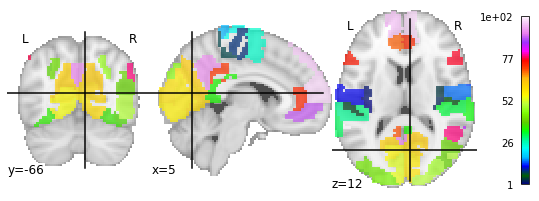

In [16]:
# nplt.plot_roi(tsmean['map'], colorbar=True)
preproc.plot_atlas()

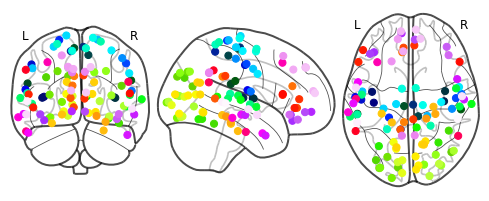

In [17]:
preproc.plot_connectom()

In [12]:
# def load_1d(fname):
#     with open(join(fname),'rb') as fr:
#         txt_1d = np.loadtxt(fr, delimiter='\n')

#     return txt_1d

In [8]:
# dir_3dmaskave = join(dir_root, stat, 'tsmean')

In [9]:
# rr = []
# for module in ['Core', 'MTLsub', 'dMsub']:
#     tmp = glob(join(dir_fmri, 'masks', 'DMN', module+'_*.nii'))
#     for path in tmp:
#         region = path.split('/')[-1].replace('.nii', '')
#         rr.append(region)

In [10]:
# ## tsmean.errts_tproject_bp.subj.run.region.1D 의 개수가 폴더당 360(=12*30)개가 아닌 355개임.
# ## -> errts_tproject_bp의 run 5개 누락있음.
# list_1D = []
# for region in rr:
#     list_1D.append(sorted(glob(join(dir_3dmaskave, region, '*.1D'))))
# list_1D = np.concatenate(list_1D)

---

## 2. Correlation matrix is used as a weighted edge in the network

In [18]:
# BOLDshape = (1095, 103) # 1095 = 3*5*73
# BOLDshape = (1096, 103) # 1096 = 2^3*137
BOLDshape = tsmean[('GA01','r01')].shape

## The number of windows per Run
wpr = 8

## The width of the window
WW = BOLDshape[0]//wpr

## The number of nodes
nnodes = BOLDshape[-1]
# nnodes = tsmean['labels']

OUTPUTshape = (wpr,WW,nnodes)
print(OUTPUTshape)

(8, 137, 103)


In [19]:
from nilearn.connectome import ConnectivityMeasure

measure = ConnectivityMeasure(kind='correlation')

absence_run = {}
for nn in list_subj:
    for gg in ['GA', 'GB']:
        absence_run[gg+nn] = np.array(['r%02d'%(r+1) for r in range(6)])

temporal_corrmat = {}
for (subj, run), BOLD in tsmean_genuine.items():
    absence_run[subj] = absence_run[subj][absence_run[subj] != run]
    
    ## shape: (wpr, nnodes, nnodes)
    temporal_corrmat[(subj, run)] = measure.fit_transform(
        BOLD[:BOLDshape[0],:BOLDshape[1]].reshape(OUTPUTshape)
    )

for nn in list_subj:
    for gg in ['GA', 'GB']:
        if len(absence_run[gg+nn]) == 0:
            del absence_run[gg+nn]
        else:
            absence_run[gg+nn] = list(absence_run[gg+nn])
print("absence_run: %s"%absence_run)

absence_run: {}


In [20]:
mdict = {}
mdict['key'] = np.ones(np.array(list(temporal_corrmat.keys())).shape, dtype='U6')
mdict['A'] = np.ones((mdict['key'].shape[0], wpr, nnodes, nnodes)) * np.nan
for i, ((subj, run), supraadjacency) in enumerate(temporal_corrmat.items()):
    ## (size of a window*runs, # nodes, # nodes)
    mdict['key'][i] = [subj, run]
    mdict['A'][i] = supraadjacency
print(mdict['key'].shape, mdict['A'].shape)

# import scipy.io
# import scipy.sparse
    
# scipy.io.savemat(
#     '/home/sungbeenpark/GA/GenLouvain/supraadjacency.node=%d.wpr=%d.mat'%(nnodes,wpr)
#     , mdict=mdict
# )

# ## 'systemByNode' represents names of systemsj
# mdict = {}
# list_ = []
# for comm in tsmean['regions'].keys():
#     for node in tsmean['regions'][comm]:
#         list_.append(comm)
# mdict['systemByNode'] = np.array(list_).astype('object')
# scipy.io.savemat('/home/sungbeenpark/Github/labs/GA/fmri_data/systemByNode.mat', mdict=mdict)

# ## 'systemByNode' represents names of nodes
# mdict = {}
# for comm in tsmean['regions'].keys():
#     list_ = []
#     for node in tsmean['regions'][comm]:
#         list_.append(node)
#     mdict[comm] = np.array(list_).astype('object')
# scipy.io.savemat('/home/sungbeenpark/Github/labs/GA/fmri_data/systemByNode.mat', mdict=mdict)

(360, 2) (360, 8, 103, 103)


---

In [21]:
# wpr = 8
# temporal_corrmat = preproc.get_temporal_corrmat_by_mapping(nwindows=wpr)

---

## 2-1. Plot correlation matrix

In [14]:
# plt.rcParams['image.cmap'] = 'autumn'

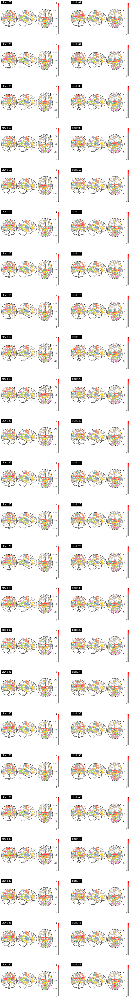

In [17]:
# nrows, ncols = 24, 2
# fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*7.5, nrows*5))
# # fig.suptitle(subj, fontsize=16)
# axs = np.concatenate(axs)

# for layer in range(48):
#     ax = axs[layer]
    
#     adjacency_matrix = mean_supraadjacency_matrix[layer,:,:]
#     ## plot connectome with 99.5% edge strength in the connectivity
#     img = nplt.plot_connectome(
#         adjacency_matrix, preproc.nodecoord
#         , edge_vmax=1., edge_vmin=0.
#         , axes=ax, title='block %02d'%(layer+1)
#         , edge_threshold='99.5%', colorbar=True
#     )

---

In [21]:
## (피험자, RUN) 별로 temporal correlation matrix(=supra-adjacency matrix)를 평균함

## (2 days, 30 subjects, 6 runs, 103 nodes, 103 nodes)
adjacency = np.ones((2, 30, 6, nnodes, nnodes)) * np.nan
print(adjacency.shape)

for i, (ggnn, rr) in enumerate(mdict['key']):
    gg, nn = ggnn[:2], ggnn[2:]
    ## 피험자는 총 30*2명 (GA, GB 따로; 숫자 nn은 30개)
    idx_nn = np.where(np.array(list_subj)==nn)[0][0]
    ## GA('early') vs. GB('late')
    idx_gg = 0 if gg=='GA' else (1 if gg=='GB' else 'invalid')
    ## 'practice': r01-r03, 'unpractice': r04-r06
    idx_rr = np.where(np.array(list_run)==rr)[0][0]

    ## temporal matrix를 across time(=window)에 대해서 평균함, mdict['A'][i] = (window, node, node)
    adjacency[idx_gg, idx_nn, idx_rr, :, :] = np.nanmean(mdict['A'][i], axis=0)

print(i)
## 빠진 run 5개에는 nan으로 채움
## 'GB08': ['r05'], 'GB23': ['r01', 'r02'], 'GB36': ['r05', 'r06'],
for vv, visit in enumerate(['early', 'late']):
    for ss, subj in enumerate(list_subj):
        for rr, run in enumerate(list_run):
            if np.isnan(adjacency[vv, ss, rr].sum()):
                gg = 'GA' if visit=='early' else ('GB' if visit=='late' else 'invalid')
                print(gg+subj, run)

(2, 30, 6, 103, 103)
359


/tmp/ipykernel_1160983/2055051605.py:21: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


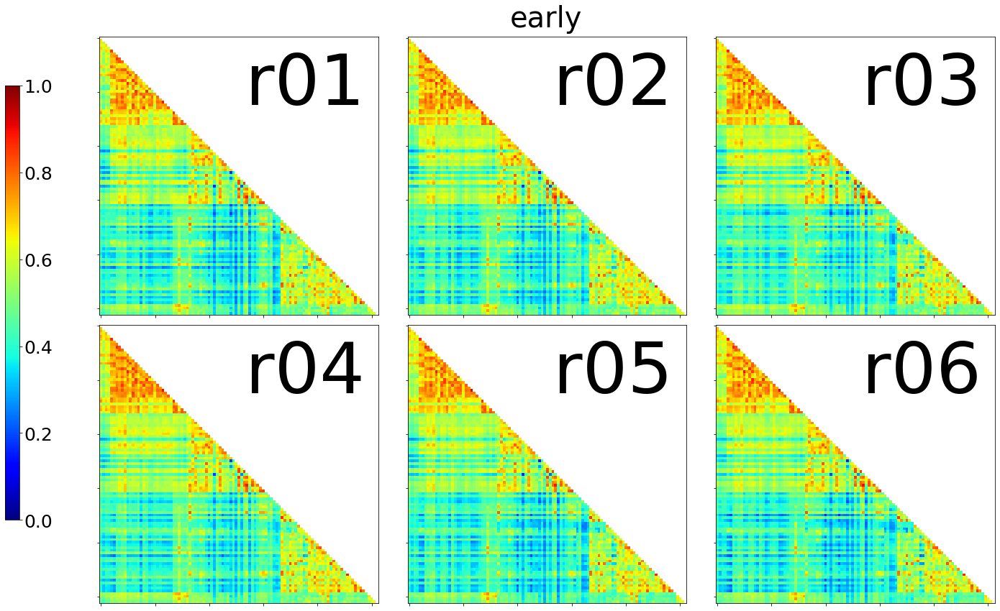

In [22]:
## GA
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(18,12))
axs = np.concatenate(axs)

for r, run in enumerate(list_run):
    ax = axs[r]
    img = nplt.plot_matrix(
        mat=np.nanmean(adjacency[0], axis=0)[r]
#         mat=adjacency[0][23][r]
        , tri='lower'
        , cmap='jet', vmax=1., vmin=0., colorbar=False
        , axes=ax
        , title=run
    )
fig.suptitle('early', size=40)

cax = fig.add_axes([-.08, .15, .015, .7])
cbar = fig.colorbar(img, cax=cax)
cbar.ax.tick_params(labelsize=25)

fig.tight_layout()

/tmp/ipykernel_1160983/2333265334.py:20: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


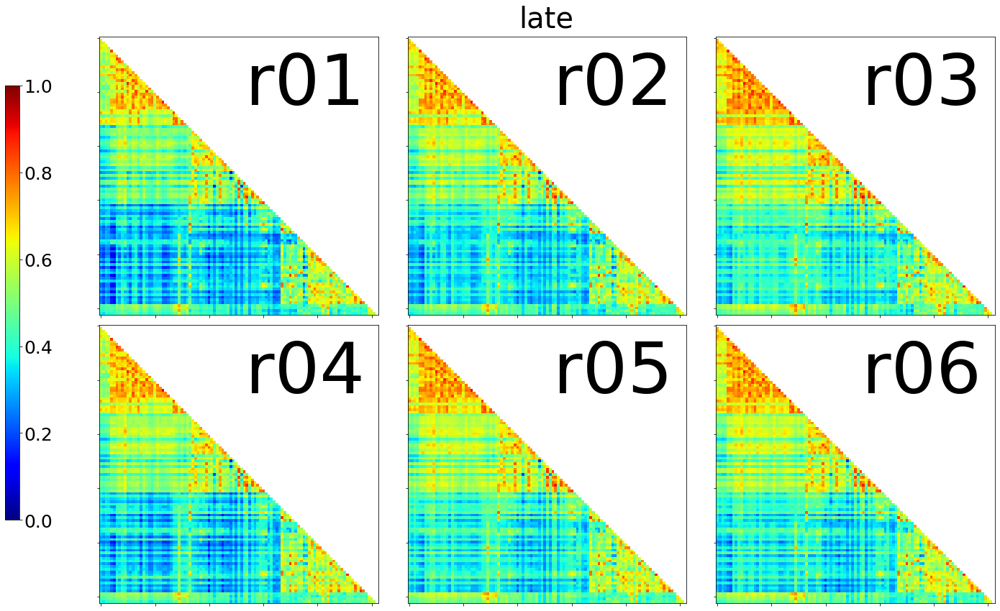

In [23]:
## GB
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(18,12))
axs = np.concatenate(axs)

for r, run in enumerate(list_run):
    ax = axs[r]
    img = nplt.plot_matrix(
        mat=np.nanmean(adjacency[1], axis=0)[r]
        , tri='lower'
        , cmap='jet', vmax=1, vmin=0., colorbar=False
        , axes=ax
        , title=run
    )
fig.suptitle('late', size=40)

cax = fig.add_axes([-.08, .15, .015, .7])
cbar = fig.colorbar(img, cax=cax)
cbar.ax.tick_params(labelsize=25)

fig.tight_layout()

/tmp/ipykernel_1160983/532802325.py:20: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


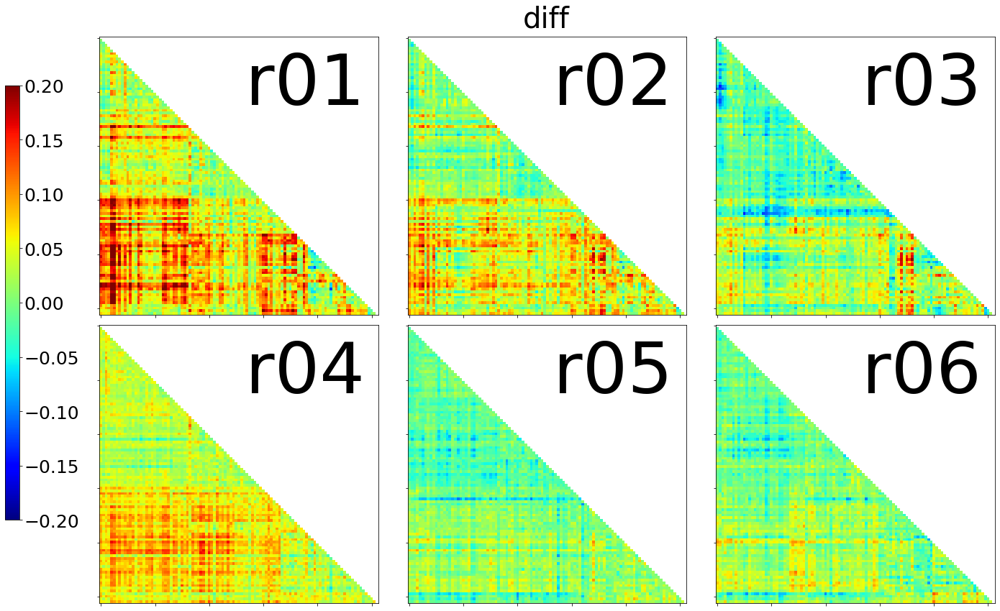

In [24]:
## GB - GA
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(18,12))
axs = np.concatenate(axs)

for r, run in enumerate(list_run):
    ax = axs[r]
    img = nplt.plot_matrix(
        mat=np.nanmean(adjacency[0]-adjacency[1], axis=0)[r]
        , tri='lower'
        , cmap='jet', vmax=.2, vmin=-.2, colorbar=False
        , axes=ax
        , title=run
    )
fig.suptitle('diff', size=40)

cax = fig.add_axes([-.08, .15, .015, .7])
cbar = fig.colorbar(img, cax=cax)
cbar.ax.tick_params(labelsize=25)

fig.tight_layout()

/tmp/ipykernel_1160983/3531452081.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


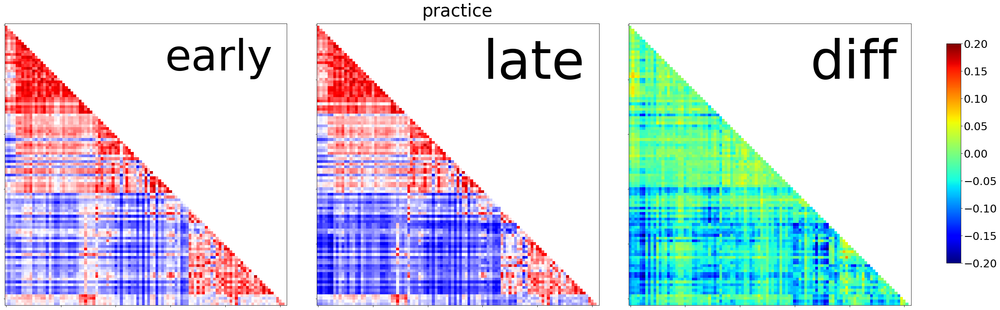

In [25]:
## practice
nrows = 1
ncols = 3
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*10, nrows*10))

for i, visit in enumerate(['early', 'late', 'diff']):
    ax = axs[i]
    if visit == 'diff':
        matrix = np.nanmean(adjacency[1,:,:3]-adjacency[0,:,:3], axis=(0,1))
        cmap='jet'
        vmax, vmin = .2, -.2
    else:
        ## GA or GB 30명, Run r01-r03 3개에 대한 평균
        matrix = np.nanmean(adjacency[i,:,:3], axis=(0,1))
        cmap='seismic'
        vmax, vmin = 1., 0.
    img = nplt.plot_matrix(
        matrix
        , vmax=vmax, vmin=vmin
        , tri='lower', title=visit
        , cmap=cmap, colorbar=False, axes=ax
    )
cax = fig.add_axes([1.02, .15, .015, .7])
cbar = fig.colorbar(img, cax=cax)
cbar.ax.tick_params(labelsize=25)

fig.suptitle('practice', size=40)
fig.tight_layout()

/tmp/ipykernel_1160983/803944065.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


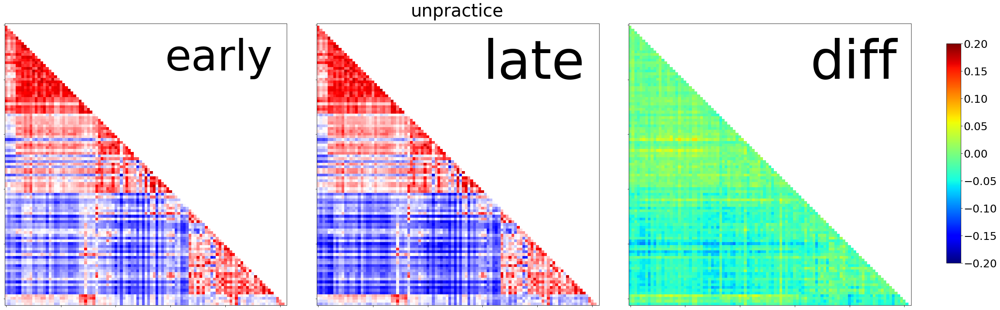

In [26]:
## unpractice
nrows = 1
ncols = 3
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*10, nrows*10))

for i, visit in enumerate(['early', 'late', 'diff']):
    ax = axs[i]
    if visit == 'diff':
        matrix = np.nanmean(adjacency[1,:,3:]-adjacency[0,:,3:], axis=(0,1))
        cmap='jet'
        vmax, vmin = .2, -.2
    else:
        ## GA or GB 30명, Run r04-r06 3개에 대한 평균
        matrix = np.nanmean(adjacency[i,:,3:], axis=(0,1))
        cmap='seismic'
        vmax, vmin = 1., 0.
    img = nplt.plot_matrix(
        matrix
        , vmax=vmax, vmin=vmin
        , tri='lower', title=visit
        , cmap=cmap, colorbar=False, axes=ax
    )
cax = fig.add_axes([1.02, .15, .015, .7])
cbar = fig.colorbar(img, cax=cax)
cbar.ax.tick_params(labelsize=25)

fig.suptitle('unpractice', size=40)
fig.tight_layout()

/tmp/ipykernel_1160983/2290954591.py:60: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


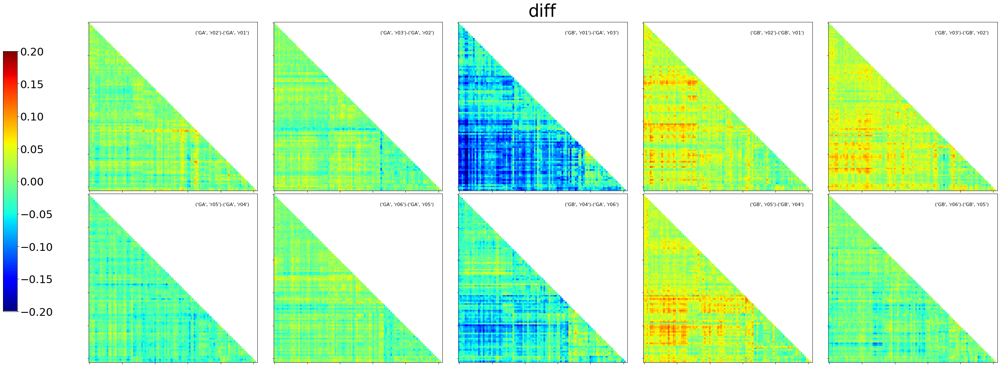

In [27]:
## sequential changes of practice, unpractice

fig, axs = plt.subplots(nrows=2, ncols=5, figsize=(30,12))
# axs = np.concatenate(axs)
runs = np.array(['r%02d'%(r+1) for r in range(6)])

## practice
list_ = []
for visit in ['GA', 'GB']:
    for run in runs[:3]:
        list_.append((visit, run))
for i, (gg, rr) in enumerate(list_[:-1]):
    ax = axs[0,i]
    
    g = 0 if gg=='GA' else (1 if gg=='GB' else 'invalid')
    r = int(np.squeeze(np.where(runs==rr)))
    before = adjacency[g,:,r]
    
    g = 0 if list_[i+1][0]=='GA' else (1 if list_[i+1][0]=='GB' else 'invalid')
    r = int(np.squeeze(np.where(runs==list_[i+1][1])))
    after = adjacency[g,:,r]
    
    img = nplt.plot_matrix(
        mat=np.nanmean(after-before, axis=0)
        , tri='lower'
        , cmap='jet', vmax=.2, vmin=-.2, colorbar=False
        , axes=ax
        , title='%s-%s'%(list_[i+1], list_[i])
    )
## unpractice
list_ = []
for visit in ['GA', 'GB']:
    for run in runs[3:]:
        list_.append((visit, run))
for i, (gg, rr) in enumerate(list_[:-1]):
    ax = axs[1,i]
    
    g = 0 if gg=='GA' else (1 if gg=='GB' else 'invalid')
    r = int(np.squeeze(np.where(runs==rr)))
    before = adjacency[g,:,r]
    
    g = 0 if list_[i+1][0]=='GA' else (1 if list_[i+1][0]=='GB' else 'invalid')
    r = int(np.squeeze(np.where(runs==list_[i+1][1])))
    after = adjacency[g,:,r]
    
    img = nplt.plot_matrix(
        mat=np.nanmean(after-before, axis=0)
        , tri='lower'
        , cmap='jet', vmax=.2, vmin=-.2, colorbar=False
        , axes=ax
        , title='%s-%s'%(list_[i+1], list_[i])
    )
    
fig.suptitle('diff', size=40)

cax = fig.add_axes([-.08, .15, .015, .7])
cbar = fig.colorbar(img, cax=cax)
cbar.ax.tick_params(labelsize=25)

fig.tight_layout()

## 2-2 Measurements

In [28]:
staticcommunity = []
for network, nodes in tsmean['regions'].items():
    staticcommunity.append([network for _ in nodes])
staticcommunity = np.concatenate(staticcommunity)
staticcommunity

array(['somatomotor', 'somatomotor', 'somatomotor', 'somatomotor',
       'somatomotor', 'somatomotor', 'somatomotor', 'somatomotor',
       'somatomotor', 'somatomotor', 'somatomotor', 'somatomotor',
       'somatomotor', 'somatomotor', 'somatomotor', 'somatomotor',
       'somatomotor', 'somatomotor', 'somatomotor', 'somatomotor',
       'somatomotor', 'somatomotor', 'somatomotor', 'somatomotor',
       'somatomotor', 'somatomotor', 'somatomotor', 'somatomotor',
       'somatomotor', 'somatomotor', 'somatomotor', 'somatomotor',
       'somatomotor', 'vision', 'vision', 'vision', 'vision', 'vision',
       'vision', 'vision', 'vision', 'vision', 'vision', 'vision',
       'vision', 'vision', 'vision', 'vision', 'vision', 'vision',
       'vision', 'vision', 'vision', 'vision', 'vision', 'vision',
       'vision', 'vision', 'vision', 'vision', 'vision', 'vision',
       'vision', 'vision', 'vision', 'vision', 'vision', 'DMN', 'DMN',
       'DMN', 'DMN', 'DMN', 'DMN', 'DMN', 'DMN', 'DMN

Behavioural Data

In [29]:
import pickle as pkl

## load data (2 days, 30 subjects, 48 blocks)
with open(join('/home/sungbeenpark/Github/labs/GA/behav_data/RewardRate.pkl'), 'rb') as f:
    tmp = pkl.load(f)
print(tmp.shape)

## (visit, subj, run)=(2, 30, 6) 포맷에 맞춰서 정리
performance = np.ones((2, 30, 6)) * np.nan
for vv, visit in enumerate(['early', 'late']):
    for rr, run in enumerate(list_run):
        performance[vv,:,rr] = np.mean(tmp[vv,:,8*rr:8*(rr+1)], axis=1)

## 6 runs(r01, r02, ..., r06) -> 2 maps(practice, unpractice)
mean_performance = np.ones((2,30,2)) * np.nan
for mm, mapping in enumerate(['practice', 'unpractice']):
    mean_performance[:,:,mm] = np.nanmean(performance[:,:,3*mm:3*(mm+1)], axis=2)

(2, 30, 48)


- Performance vs. Recruitment

In [30]:
adjacency.shape

(2, 30, 6, 103, 103)

In [31]:
## Recruitment, 2 days, 30 subjects, 6 runs, 3 networks
R = np.ones((2,30,6,3)) * np.nan

networks = np.unique(staticcommunity)
print(networks)
for vv, visit in enumerate(['early', 'late']):
    for ss, subj in enumerate(list_subj):
        for rr, run in enumerate(list_run):
            recruitment = calc_recruitment(adjacency[vv,ss,rr], staticcommunity)
            for nn, network in enumerate(networks):
                R[vv,ss,rr,nn] = np.mean(recruitment[staticcommunity==network])
                
## 6 runs(r01, r02, ..., r06) -> 2 maps(practice, unpractice)
mean_R = np.ones((2,30,2,3)) * np.nan
for mm, mapping in enumerate(['practice', 'unpractice']):
    mean_R[:,:,mm,:] = np.nanmean(R[:,:,3*mm:3*(mm+1)], axis=2)

['DMN' 'somatomotor' 'vision']


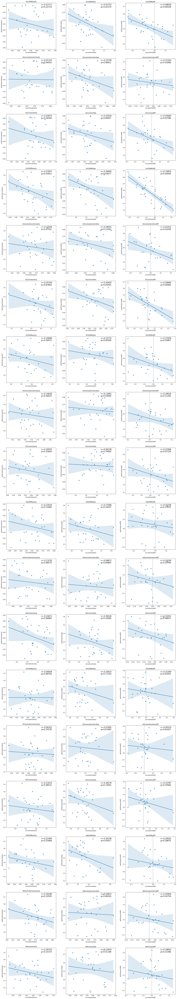

In [32]:
fig, axs = plt.subplots(nrows=3*6, ncols=3, figsize=(3*8, 3*6*8))

for rr, run in enumerate(list_run):
#     ## pass 'unpractice'
#     if rr>=3:
#         continue
    for ii, network in enumerate(networks):
        row = rr*3 + ii
        idx = staticcommunity==network
        for col, visit in enumerate(['early', 'late', 'diff']):
            ax = axs[row,col]
            if visit == 'diff':
                x = R[1,:,rr,ii] - R[0,:,rr,ii]
                y = performance[1,:,rr] - performance[0,:,rr]
            else:
                x = R[col,:,rr,ii]
                y = performance[col,:,rr]

            X = x[~np.isnan(x)]
            Y = y[~np.isnan(x)]
            r, p = scipy.stats.pearsonr(X,Y)
            img = sns.regplot(
                x=X, y=Y, ax=ax
                , x_ci='ci'
            )
            img.set(
                title='%s/%s/%s'%(run, network, visit)
                , xlabel='recruitment(%s)'%visit, ylabel='performance(%s)'%visit
            )
            x0, x1 = img.get_xlim()
            y0, y1 = img.get_ylim()
            img.text(x0+(x1-x0)*.7, y0+(y1-y0)*.9, s='r=%.5f\np=%.5f'%(r,p), fontsize=15)
            if x0<=0 and x1>=0:
                ax.axvline(x=0, color='gray', linestyle='--')
# fig.suptitle('Recruitment', size=30)

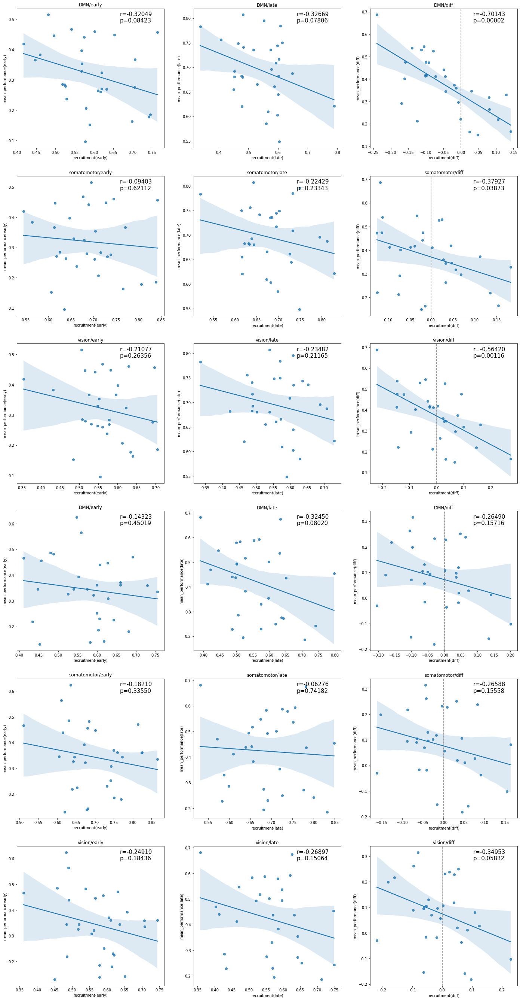

In [46]:
fig, axs = plt.subplots(nrows=3*2, ncols=3, figsize=(3*8, 3*2*8))

for mm, mapping in enumerate(['practice', 'unpractice']):
    for ii, network in enumerate(networks):
        row = 3*mm + ii
        idx = staticcommunity==network
        for col, visit in enumerate(['early', 'late', 'diff']):
            ax = axs[row,col]
            if visit == 'diff':
                x = mean_R[1,:,mm,ii] - mean_R[0,:,mm,ii]
                y = mean_performance[1,:,mm] - mean_performance[0,:,mm]
            else:
                x = mean_R[col,:,mm,ii]
                y = mean_performance[col,:,mm]

            X = x[~np.isnan(x)]
            Y = y[~np.isnan(x)]
            r, p = scipy.stats.pearsonr(X,Y)
            img = sns.regplot(
                x=X, y=Y, ax=ax
                , x_ci='ci'
            )
            img.set(
                title='%s/%s'%(network, visit)
                , xlabel='recruitment(%s)'%visit, ylabel='mean_performance(%s)'%visit
            )
            x0, x1 = img.get_xlim()
            y0, y1 = img.get_ylim()
            img.text(x0+(x1-x0)*.7, y0+(y1-y0)*.9, s='r=%.5f\np=%.5f'%(r,p), fontsize=15)
            if x0<=0 and x1>=0:
                ax.axvline(x=0, color='gray', linestyle='--')

two-tailed t-test (practice):	 p=0.01250
two-tailed t-test (unpractice):	 p=0.27339


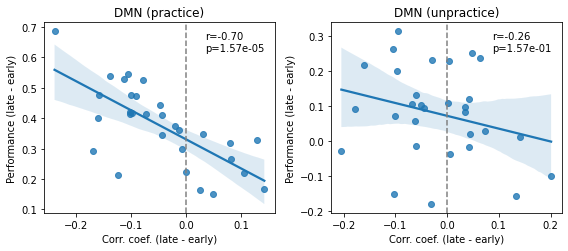

In [47]:
nrows, ncols = 1, 2
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*4, nrows*3.6))
if len(axs.shape)>1:
    axs = np.concatenate(axs)

for mm, mapping in enumerate(['practice', 'unpractice']):
    for ii, network in enumerate(['DMN']):
        ax = axs[2*ii+mm]
        idx = staticcommunity==network
        ## late - early
        x = mean_R[1,:,mm,ii] - mean_R[0,:,mm,ii]
        y = mean_performance[1,:,mm] - mean_performance[0,:,mm]
#         rank = rankdata(y, method='ordinal')

        ## Pearson's coefficient
        X = x[~np.isnan(x)]
        Y = y[~np.isnan(x)]
        r, p = scipy.stats.pearsonr(X,Y)
        img = sns.regplot(x=X, y=Y, x_ci='ci', ax=ax)
        img.set(
            title='%s (%s)'%(network, mapping)
            , xlabel='Corr. coef. (late - early)', ylabel='Performance (late - early)'
        )
        
        ## null hypothesis mu=0 (two-Tailed t-Test)
        (t0, p0) = scipy.stats.ttest_1samp(X, popmean=0, alternative='two-sided')
        print("two-tailed t-test (%s):\t"%mapping, "p=%.5f"%p0)
        
        ## insert text
        x0, x1 = img.get_xlim()
        y0, y1 = img.get_ylim()
        img.text(x0+(x1-x0)*.7, y0+(y1-y0)*.85, s='r=%.2f\np=%.2e'%(r,p), fontsize=10)
        
        ## line (x=0)
        if x0<=0 and x1>=0:
            ax.axvline(x=0, color='gray', linestyle='--')

fig.tight_layout()

In [37]:
fig.savefig('/home/sungbeenpark/GA/network.regplot.corr-coef_behav.DMN.png', dpi=300)

In [48]:
df = pd.DataFrame(columns=['visit', 'subj', 'mapping', 'network', 'recruitment'])
row = 0
for vv, visit in enumerate(['early', 'late']):
    for ss, subj in enumerate(list_subj):
        for mm, mapping in enumerate(['practice', 'unpractice']):
            for nn, network in enumerate(networks):
                df.loc[row] = [visit, subj, mapping, network, mean_R[vv,ss,mm,nn]]
                row += 1
df

,visit,subj,mapping,network,recruitment
0,early,01,practice,DMN,0.706714
1,early,01,practice,somatomotor,0.770658
2,early,01,practice,vision,0.595735
3,early,01,unpractice,DMN,0.729392
4,early,01,unpractice,somatomotor,0.824719
...,...,...,...,...,...
355,late,44,practice,somatomotor,0.643356
356,late,44,practice,vision,0.539439
357,late,44,unpractice,DMN,0.574749
358,late,44,unpractice,somatomotor,0.691384


DMN(practice): 1.250e-02 (*)
DMN(practice): 2.734e-01 (ns)
somatomotor(practice): 7.680e-01 (ns)
somatomotor(practice): 7.424e-01 (ns)
vision(practice): 7.908e-01 (ns)
vision(practice): 6.482e-01 (ns)


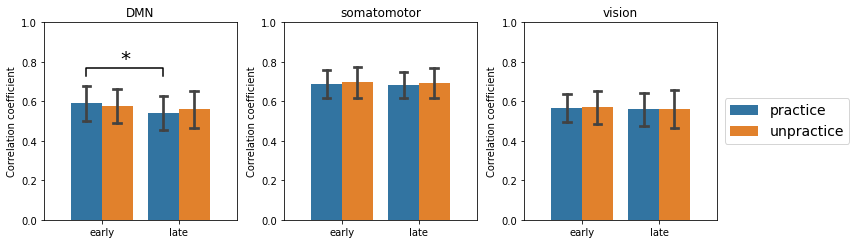

In [49]:
nrows, ncols = 1, 3
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*4, nrows*3.5))

for ii, network in enumerate(networks):
    ax = axs[ii]
    
    data = df[df.network==network]
    x='visit'
    y='recruitment'
    hue='mapping'
    
    ax = sns.barplot(
        data=data
        , x=x, y=y, hue=hue
        , capsize=.1, ci='sd', ax=ax
    )
    ax.set(
        title=network
        , xlim=(-.75,1.75), xlabel=None
        , ylim=(0., 1.), ylabel='Correlation coefficient'
    )
    if ii<2:
        ax.legend().remove()
    else:
        ax.legend(
            fontsize=14, frameon=True
            , bbox_to_anchor=(1.04,0.5), loc="center left"
            , borderaxespad=0
        )
    
    ## paried t-test
    A = data[(data.visit=='early')&(data.mapping=='practice')].recruitment
    B = data[(data.visit=='late')&(data.mapping=='practice')].recruitment
    isntnan = (~np.isnan(A.values))*(~np.isnan(B.values))
    tval, pval = scipy.stats.ttest_rel(A[isntnan],B[isntnan])
    symbol = convert_pvalue_to_asterisks(pval)
    print('%s(practice): %.3e (%s)'%(network, pval, symbol))
    A = data[(data.visit=='early')&(data.mapping=='unpractice')].recruitment
    B = data[(data.visit=='late')&(data.mapping=='unpractice')].recruitment
    tval, pval = scipy.stats.ttest_rel(A[isntnan],B[isntnan])
    symbol = convert_pvalue_to_asterisks(pval)
    print('%s(practice): %.3e (%s)'%(network, pval, symbol))

## statistical annotation
ep = 0.2
### DMN
ax = axs[0]
data = df[df.network=='DMN']
#### practice
x1, x2 = 0-ep, 1-ep # columns 'early' and 'late' (first column: 0, see plt.xticks())
A = data[(data.visit=='early')&(data.mapping=='practice')].recruitment
B = data[(data.visit=='late')&(data.mapping=='practice')].recruitment
y0, h = max(A.mean()+A.std(), B.mean()+B.std())+.05, 0.04
ax.plot([x1, x1, x2, x2], [y0, y0+h, y0+h, y0], lw=1.5, c='k')
ax.text(
    (x1+x2)*.5, y0+h
    , '*'
    , ha='center', va='bottom', fontdict={'fontsize': 20, 'color': 'k'}
)

fig.tight_layout()

In [40]:
fig.savefig('/home/sungbeenpark/GA/network.barplots.corr-coef.png', dpi=300)

- Performance vs. Integration

In [50]:
## Integration, 2 days, 30 subjects, 6 runs, 3 networks
I = np.ones((2,30,6,3)) * np.nan

networks = np.unique(staticcommunity)
for vv, visit in enumerate(['early', 'late']):
    for ss, subj in enumerate(list_subj):
        for rr, run in enumerate(list_run):
            integration = calc_integration(adjacency[vv,ss,rr], staticcommunity)
            for nn, network in enumerate(networks):
                I[vv,ss,rr,nn] = np.mean(integration[staticcommunity==network])
## 6 runs(r01, r02, ..., r06) -> 2 maps(practice, unpractice)
mean_I = np.ones((2,30,2,3)) * np.nan
for mm, mapping in enumerate(['practice', 'unpractice']):
    mean_I[:,:,mm,:] = np.nanmean(I[:,:,3*mm:3*(mm+1)], axis=2)

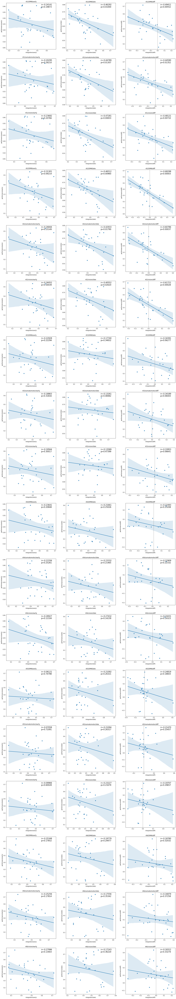

In [51]:
fig, axs = plt.subplots(nrows=3*6, ncols=3, figsize=(3*8, 3*6*8))

for rr, run in enumerate(list_run):
#     ## pass 'unpractice'
#     if rr>=3:
#         continue
    for ii, network in enumerate(np.unique(staticcommunity)):
        row = rr*3 + ii
        idx = staticcommunity==network
        for col, visit in enumerate(['early', 'late', 'diff']):
            ax = axs[row,col]
            if visit == 'diff':
                x = I[1,:,rr,ii] - I[0,:,rr,ii]
                y = performance[1,:,rr] - performance[0,:,rr]
            else:
                x = I[col,:,rr,ii]
                y = performance[col,:,rr]

            X = x[~np.isnan(x)]
            Y = y[~np.isnan(x)]
            r, p = scipy.stats.pearsonr(X,Y)
            img = sns.regplot(
                x=X, y=Y, ax=ax
                , x_ci='ci'
            )
            img.set(
                title='%s/%s/%s'%(run, network, visit)
                , xlabel='integration(%s)'%visit, ylabel='performance(%s)'%visit
            )
            x0, x1 = img.get_xlim()
            y0, y1 = img.get_ylim()
            img.text(x0+(x1-x0)*.7, y0+(y1-y0)*.9, s='r=%.5f\np=%.5f'%(r,p), fontsize=15)
            if x0<=0 and x1>=0:
                ax.axvline(x=0, color='gray', linestyle='--')

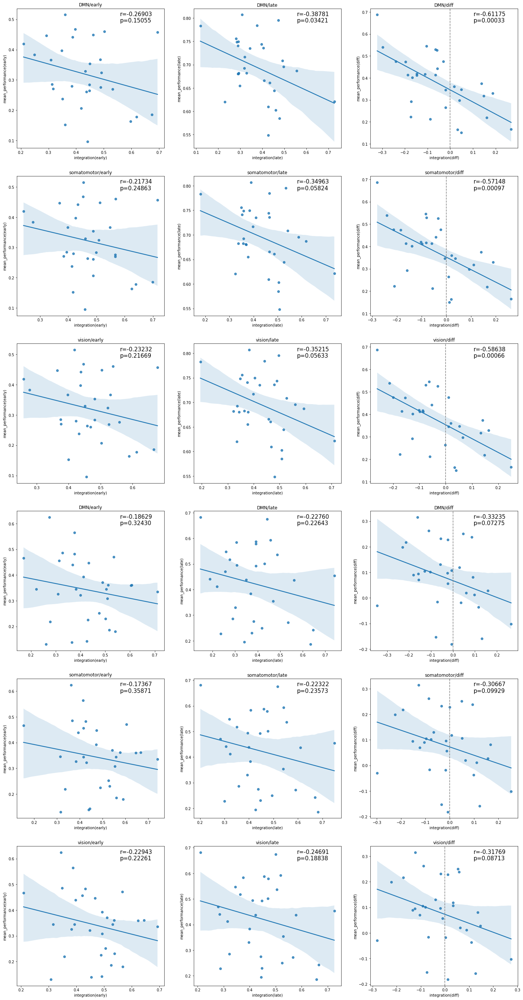

In [52]:
fig, axs = plt.subplots(nrows=3*2, ncols=3, figsize=(3*8, 3*2*8))

for mm, mapping in enumerate(['practice', 'unpractice']):
    for ii, network in enumerate(networks):
        row = 3*mm + ii
        idx = staticcommunity==network
        for col, visit in enumerate(['early', 'late', 'diff']):
            ax = axs[row,col]
            if visit == 'diff':
                x = mean_I[1,:,mm,ii] - mean_I[0,:,mm,ii]
                y = mean_performance[1,:,mm] - mean_performance[0,:,mm]
            else:
                x = mean_I[col,:,mm,ii]
                y = mean_performance[col,:,mm]

            X = x[~np.isnan(x)]
            Y = y[~np.isnan(x)]
            r, p = scipy.stats.pearsonr(X,Y)
            img = sns.regplot(
                x=X, y=Y, ax=ax
                , x_ci='ci'
            )
            img.set(
                title='%s/%s'%(network, visit)
                , xlabel='integration(%s)'%visit, ylabel='mean_performance(%s)'%visit
            )
            x0, x1 = img.get_xlim()
            y0, y1 = img.get_ylim()
            img.text(x0+(x1-x0)*.7, y0+(y1-y0)*.9, s='r=%.5f\np=%.5f'%(r,p), fontsize=15)
            if x0<=0 and x1>=0:
                ax.axvline(x=0, color='gray', linestyle='--')

two-tailed t-test (practice):	 p=0.05363
two-tailed t-test (unpractice):	 p=0.17075


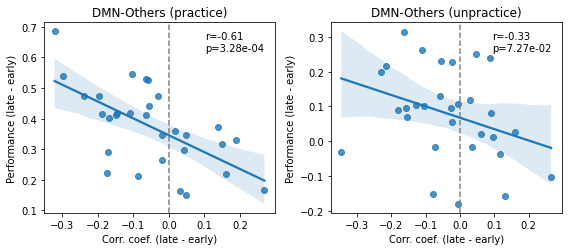

In [53]:
nrows, ncols = 1, 2
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*4, nrows*3.6))
if len(axs.shape)>1:
    axs = np.concatenate(axs)

for mm, mapping in enumerate(['practice', 'unpractice']):
    for ii, network in enumerate(['DMN']):
        ax = axs[2*ii+mm]
        idx = staticcommunity==network
        ## late - early
        x = mean_I[1,:,mm,ii] - mean_I[0,:,mm,ii]
        y = mean_performance[1,:,mm] - mean_performance[0,:,mm]
#         rank = rankdata(y, method='ordinal')

        ## Pearson's coefficient
        X = x[~np.isnan(x)]
        Y = y[~np.isnan(x)]
        r, p = scipy.stats.pearsonr(X,Y)
        img = sns.regplot(x=X, y=Y, x_ci='ci', ax=ax)
        img.set(
            title='DMN-Others (%s)'%(mapping)
            , xlabel='Corr. coef. (late - early)', ylabel='Performance (late - early)'
        )
        
        ## null hypothesis mu=0 (two-Tailed t-Test)
        (t0, p0) = scipy.stats.ttest_1samp(X, popmean=0, alternative='two-sided')
        print("two-tailed t-test (%s):\t"%mapping, "p=%.5f"%p0)
        
        ## line (x=0)
        if x0<=0 and x1>=0:
            ax.axvline(x=0, color='gray', linestyle='--')
        ## insert text
        x0, x1 = img.get_xlim()
        y0, y1 = img.get_ylim()
        img.text(x0+(x1-x0)*.7, y0+(y1-y0)*.85, s='r=%.2f\np=%.2e'%(r,p), fontsize=10)

fig.tight_layout()

In [44]:
fig.savefig('/home/sungbeenpark/GA/network.regplot.corr-coef_behav.DMN-others.png', dpi=300)

In [54]:
df = pd.DataFrame(columns=['visit', 'subj', 'mapping', 'network', 'integration'])
row = 0
for vv, visit in enumerate(['early', 'late']):
    for ss, subj in enumerate(list_subj):
        for mm, mapping in enumerate(['practice', 'unpractice']):
            for nn, network in enumerate(networks):
                df.loc[row] = [visit, subj, mapping, network, mean_I[vv,ss,mm,nn]]
                row += 1
df

,visit,subj,mapping,network,integration
0,early,01,practice,DMN,0.486940
1,early,01,practice,somatomotor,0.547670
2,early,01,practice,vision,0.530276
3,early,01,unpractice,DMN,0.604456
4,early,01,unpractice,somatomotor,0.645700
...,...,...,...,...,...
355,late,44,practice,somatomotor,0.369822
356,late,44,practice,vision,0.378550
357,late,44,unpractice,DMN,0.374752
358,late,44,unpractice,somatomotor,0.446571


DMN(practice): 5.363e-02 (ns)
DMN(unpractice): 1.707e-01 (ns)


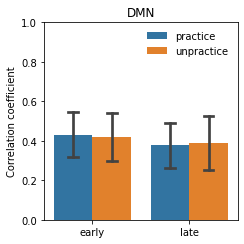

In [55]:
nrows, ncols = 1, 1
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*3.5, nrows*3.5))

# for ii, network in enumerate(networks):
#     ax = axs[ii]
for ii, network in enumerate(['DMN']):
    ax = axs
    
    data = df[df.network==network]
    x='visit'
    y='integration'
    hue='mapping'
    
    ax = sns.barplot(
        data=data
        , x=x, y=y, hue=hue
        , capsize=.1, ci='sd', ax=ax
    )
    ax.set(
        title=network
        , xlim=(-.5,1.5), xlabel=None
        , ylim=(0., 1.), ylabel='Correlation coefficient'
    )
    ax.legend(loc='upper right', fontsize=10, frameon=False)
    
    ## paried t-test
    A = data[(data.visit=='early')&(data.mapping=='practice')].integration
    B = data[(data.visit=='late')&(data.mapping=='practice')].integration
    isntnan = (~np.isnan(A.values))*(~np.isnan(B.values))
    tval, pval = scipy.stats.ttest_rel(A[isntnan],B[isntnan])
    symbol = convert_pvalue_to_asterisks(pval)
    print('%s(practice): %.3e (%s)'%(network, pval, symbol))
    A = data[(data.visit=='early')&(data.mapping=='unpractice')].integration
    B = data[(data.visit=='late')&(data.mapping=='unpractice')].integration
    tval, pval = scipy.stats.ttest_rel(A[isntnan],B[isntnan])
    symbol = convert_pvalue_to_asterisks(pval)
    print('%s(unpractice): %.3e (%s)'%(network, pval, symbol))
    
fig.tight_layout()

In [49]:
fig.savefig('/home/sungbeenpark/GA/network.barplot.corr-coef.DMN-others.png', dpi=300)

- Integration between `somatomotor` ans `visual` area

In [60]:
## Somatomotor-Vision integration: 2 days, 30 subjects, 6 runs, 2 networks
I = np.ones((2,30,6,2)) * np.nan

visuomotor = staticcommunity!='DMN'
tmp = adjacency[:,:,:,:,visuomotor]
tmp = tmp[:,:,:,visuomotor,:]
print(tmp.shape)

(2, 30, 6, 67, 67)


In [61]:
for vv, visit in enumerate(['early', 'late']):
    for ss, subj in enumerate(list_subj):
        for rr, run in enumerate(list_run):
            integration = calc_integration(tmp[vv,ss,rr], staticcommunity[visuomotor])
            for nn, network in enumerate(['somatomotor', 'vision']):
                I[vv,ss,rr,nn] = np.mean(integration[staticcommunity[visuomotor]==network])
                
## 6 runs(r01, r02, ..., r06) -> 2 maps(practice, unpractice)
mean_I = np.ones((2,30,2,2)) * np.nan
for mm, mapping in enumerate(['practice', 'unpractice']):
    mean_I[:,:,mm,:] = np.nanmean(I[:,:,3*mm:3*(mm+1)], axis=2)

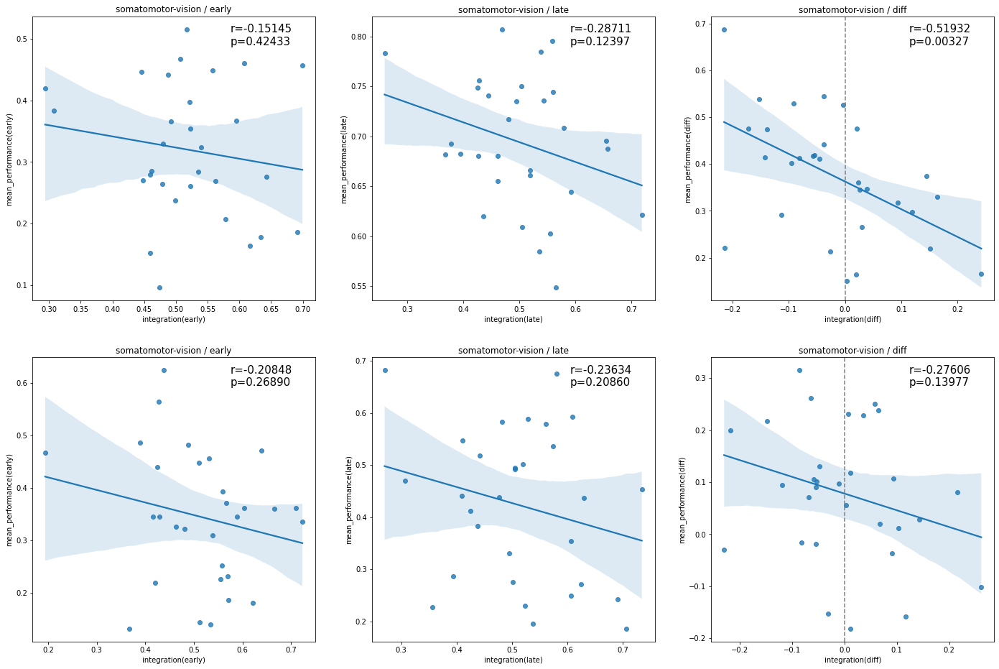

In [62]:
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(3*8, 2*8))

for mm, mapping in enumerate(['practice', 'unpractice']):
    mean_performance = np.nanmean(performance[:,:,3*mm:3*(mm+1)], axis=2)
    mean_I = np.nanmean(I[:,:,3*mm:3*(mm+1)], axis=2)
    ## somatomotor 와 vision 밖에 없으므로, integration 은 같음. 즉 둘 중 하나만 고려하면 됨.
    for ii, network in enumerate(['somatomotor']):
        row = mm + ii
        idx = staticcommunity==network
        for col, visit in enumerate(['early', 'late', 'diff']):
            ax = axs[row,col]
            if visit == 'diff':
                x = mean_I[1,:,ii] - mean_I[0,:,ii]
                y = mean_performance[1,:] - mean_performance[0,:]
            else:
                x = mean_I[col,:,ii]
                y = mean_performance[col,:]

            X = x[~np.isnan(x)]
            Y = y[~np.isnan(x)]
            r, p = scipy.stats.pearsonr(X,Y)
            img = sns.regplot(
                x=X, y=Y, ax=ax
                , x_ci='ci'
            )
            ## Lower-Tailed t-Test
            img.set(
                title='somatomotor-vision / %s'%(visit)
                , xlabel='integration(%s)'%visit, ylabel='mean_performance(%s)'%visit
            )
            x0, x1 = img.get_xlim()
            y0, y1 = img.get_ylim()
            img.text(x0+(x1-x0)*.7, y0+(y1-y0)*.9, s='r=%.5f\np=%.5f'%(r,p), fontsize=15)
            if x0<=0 and x1>=0:
                ax.axvline(x=0, color='gray', linestyle='--')

two-tailed t-test (practice):	 p=0.94568
two-tailed t-test (unpractice):	 p=0.94568


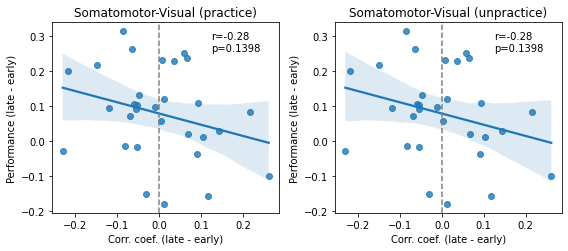

In [64]:
nrows, ncols = 1, 2
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*4, nrows*3.6))
if len(axs.shape)>1:
    axs = np.concatenate(axs)

for mm, mapping in enumerate(['practice', 'unpractice']):
    ## normalize (divided by a sum of the recruitment)
#     mean_I = mean_I / mean_R[:,:,:2]
    ## somatomotor 와 vision 밖에 없으므로, integration 은 같음. 즉 둘 중 하나만 고려하면 됨.
    for ii, network in enumerate(['somatomotor']):
        ax = axs[2*ii+mm]
        idx = staticcommunity==network
        ## late - early
        x = mean_I[1,:,mm] - mean_I[0,:,mm]
        y = mean_performance[1,:] - mean_performance[0,:]

        ## Pearson's coefficient
        X = x[~np.isnan(x)]
        Y = y[~np.isnan(x)]
        r, p = scipy.stats.pearsonr(X,Y)
        img = sns.regplot(x=X, y=Y, x_ci='ci', ax=ax)
        img.set(
            title='Somatomotor-Visual (%s)'%(mapping)
            , xlabel='Corr. coef. (late - early)', ylabel='Performance (late - early)'
        )
        
        ## null hypothesis mu=0 (two-Tailed t-Test)
        (t0, p0) = scipy.stats.ttest_1samp(X, popmean=0, alternative='two-sided')
        print("two-tailed t-test (%s):\t"%mapping, "p=%.5f"%p0)
        
        ## insert text
        x0, x1 = img.get_xlim()
        y0, y1 = img.get_ylim()
        img.text(x0+(x1-x0)*.7, y0+(y1-y0)*.85, s='r=%.2f\np=%.4f'%(r,p), fontsize=10)
        
        ## line (x=0)
        if x0<=0 and x1>=0:
            ax.axvline(x=0, color='gray', linestyle='--')

fig.tight_layout()

In [53]:
fig.savefig('/home/sungbeenpark/GA/network.regplot.corr-coef_behav.somatomotor-visual.png', dpi=300)

In [66]:
df = pd.DataFrame(columns=['visit', 'subj', 'mapping', 'network', 'integration'])
row = 0
for vv, visit in enumerate(['early', 'late']):
    for ss, subj in enumerate(list_subj):
        for mm, mapping in enumerate(['practice', 'unpractice']):
            for nn, network in enumerate(['somatomotor', 'vision']):
                df.loc[row] = [visit, subj, mapping, network, mean_I[vv,ss,mm]]
                row += 1
df

,visit,subj,mapping,network,integration
0,early,01,practice,somatomotor,0.666204
1,early,01,practice,vision,0.666204
2,early,01,unpractice,somatomotor,0.666204
3,early,01,unpractice,vision,0.666204
4,early,02,practice,somatomotor,0.416538
...,...,...,...,...,...
235,late,42,unpractice,vision,0.537772
236,late,44,practice,somatomotor,0.523854
237,late,44,practice,vision,0.523854
238,late,44,unpractice,somatomotor,0.523854


somatomotor(practice): 9.457e-01 (ns)
somatomotor(unpractice): 9.457e-01 (ns)


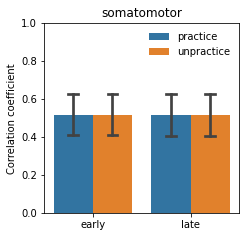

In [67]:
nrows, ncols = 1, 1
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*3.5, nrows*3.5))

# for ii, network in enumerate(networks):
#     ax = axs[ii]
for ii, network in enumerate(['somatomotor']):
    ax = axs
    
    data = df[df.network==network]
    x='visit'
    y='integration'
    hue='mapping'
    
    ax = sns.barplot(
        data=data
        , x=x, y=y, hue=hue
        , capsize=.1, ci='sd', ax=ax
    )
    ax.set(
        title=network
        , xlim=(-.5,1.5), xlabel=None
        , ylim=(0., 1.), ylabel='Correlation coefficient'
    )
    ax.legend(loc='upper right', fontsize=10, frameon=False)
    
    ## paried t-test
    A = data[(data.visit=='early')&(data.mapping=='practice')].integration
    B = data[(data.visit=='late')&(data.mapping=='practice')].integration
    isntnan = (~np.isnan(A.values))*(~np.isnan(B.values))
    tval, pval = scipy.stats.ttest_rel(A[isntnan],B[isntnan])
    symbol = convert_pvalue_to_asterisks(pval)
    print('%s(practice): %.3e (%s)'%(network, pval, symbol))
    A = data[(data.visit=='early')&(data.mapping=='unpractice')].integration
    B = data[(data.visit=='late')&(data.mapping=='unpractice')].integration
    tval, pval = scipy.stats.ttest_rel(A[isntnan],B[isntnan])
    symbol = convert_pvalue_to_asterisks(pval)
    print('%s(unpractice): %.3e (%s)'%(network, pval, symbol))


In [57]:
fig.savefig('/home/sungbeenpark/GA/network.barplot.corr-coef.somatomotor-visual.png', dpi=300)

---

In [68]:
## integration: 2 days, 30 subjects, 6 runs, 2 networks(somatomotor-vision)
print(I.shape)
df = pd.DataFrame(columns=['visit','subj','mapping','M-V integration'])

row = 0
for vv, visit in enumerate(['early', 'late']):
    for ss, subj in enumerate(list_subj):
        for mm, mapping in enumerate(['practice', 'unpractice']):
            integ = np.nanmean(I[vv,ss,3*mm:3*(mm+1),0])
            df.loc[row] = [visit, subj, mapping, integ]
            row += 1
df

(2, 30, 6, 2)


,visit,subj,mapping,M-V integration
0,early,01,practice,0.594762
1,early,01,unpractice,0.666204
2,early,02,practice,0.446264
3,early,02,unpractice,0.416538
4,early,05,practice,0.521369
...,...,...,...,...
115,late,38,unpractice,0.495541
116,late,42,practice,0.435811
117,late,42,unpractice,0.537772
118,late,44,practice,0.461822


<AxesSubplot:xlabel='visit', ylabel='M-V integration'>

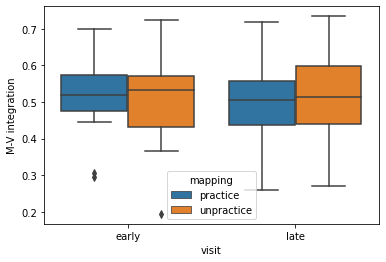

In [69]:
sns.boxplot(data=df, x='visit', y='M-V integration', hue='mapping')

## 3. Network Measures

### ⅰ) Communities (using Genlouvain.m)

In [14]:
condition = 'node=103.wpr=8.r=1.w=1.iter=100'

genlouvain_result = scipy.io.loadmat('/home/sungbeenpark/GA/GenLouvain/community.%s.mat'%condition)
communities = genlouvain_result['communities']
print(communities.shape)
Qs = genlouvain_result['Qs']
print(Qs.shape)
niter = communities.shape[1]

keys = np.array(genlouvain_result['key'], dtype='U4')
# keys = np.empty(np.array(list(tsmean_genuine.keys())).shape, dtype='U4')
# for i, (subj, run) in enumerate(tsmean_genuine.keys()):
#     keys[i,:] = str(subj), str(run)
# print(keys.shape)

(355, 100, 103, 8)
(355, 100)


In [152]:
# ## 초기조건에 따른 Q값의 변화 폭 그려보기
# df = pd.DataFrame(columns=['key', 'iter', 'modularities'])

# row = 0
# for i, (ggnn, run) in enumerate(keys):
#     key = ggnn+run
#     for j, Q in enumerate(Qs[i]):
#         df.loc[row] = [key, j, Q]
#         row += 1

# fig, axs = plt.subplots(figsize=(40, 20))

# ax = axs
# sns.boxplot(data=df, x='key', y='modularities', ax=ax)
# ax.set_xlabel('key', fontsize=40)
# ax.set_ylabel('Modularity', fontsize=40)
# ax.set_xticklabels('')

# fig.savefig('/home/sungbeenpark/GA/GenLouvain/Modularity.boxplot.png', dpi=300)

In [133]:
# ## 계산 오류값(NaN)이 없는지 확인
# for i, key in enumerate(keys):
#     print(key, communities[i].sum())

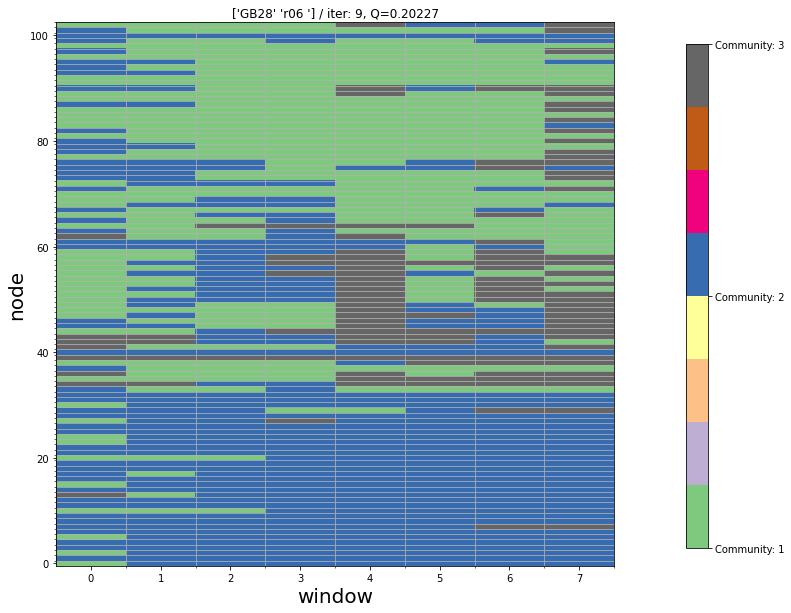

In [35]:
## 샘플로 네트워크를 그려보기
ii = np.random.choice(range(355))
jj = np.argmax(Qs[ii])
community = communities[ii]

_, N, T = community.shape

fig, axs = plt.subplots(figsize=(10,10))

ax = axs
img = ax.imshow(community[jj], cmap='Accent', interpolation=None, aspect='auto', origin='lower')
ax.set_xlabel('window', fontsize = 20)
ax.set_ylabel('node', fontsize = 20)
ax.set_title('%s / iter: %s, Q=%.5f'%(keys[ii],jj,Qs[ii,jj]))
ax.set_xticks(np.arange(T)+.5, minor=True)
ax.set_yticks(np.arange(N)+.5, minor=True)
ax.grid(axis='both', which='minor')

cax = fig.add_axes([1.0, .15, .03, .7])
cbar = fig.colorbar(img, cax=cax, ticks=[1,2,3], format='Community: %d')
cbar.ax.tick_params(labelsize=10)

### ⅱ) Module Allegiance Matrix

In [17]:
## (피험자, RUN) 별로 Module Allegiance Matrix 를 정리
import teneto.communitymeasures

## (2 days, 30 subjects, 6 runs, 103 nodes, 103 nodes)
allegiances = np.ones((2, 30, 6, 103, 103)) * np.nan

for ii, (ggnn, rr) in enumerate(tqdm(keys)):
    gg, nn = ggnn[:2], ggnn[2:]
    ## 피험자는 총 30*2명 (GA, GB 따로)
    idx_nn = np.where(np.array(list_subj)==nn)[0][0]
    ## GA('early') vs. GB('late')
    idx_gg = 0 if gg=='GA' else (1 if gg=='GB' else 'invalid')
    ## 'practice': r01-r03, 'unpractice': r04-r06
    idx_rr = np.where(np.array(list_run)==rr.strip())[0][0]

    ## modularity Q가 가장 큰 community에 대한 MA 만을 계산. 대각성분은 nan 임.
    jj = np.argmax(Qs[ii])
    allegiances[idx_gg, idx_nn, idx_rr, :, :] = teneto.communitymeasures.allegiance(communities[ii,jj])
    
#     tmp = np.ones((niter, nnodes, nnodes)) * np.nan
#     ## niter 개의 MA를 평균. 대각성분은 nan 임.
#     for jj in range(niter):
#         tmp[j] = teneto.communitymeasures.allegiance(communities[ii,jj])
#     allegiances[idx_gg, idx_nn, idx_rr, :, :] = np.mean(tmp, axis=0)

# ## save the result
# with open('/home/sungbeenpark/GA/GenLouvain/allegiance.%s.npy'%condition, 'wb') as f:
#     np.save(f, allegiances)

100%|██████████| 355/355 [00:17<00:00, 20.30it/s]


In [10]:
# with open('/home/sungbeenpark/GA/GenLouvain/allegiance.%s.npy'%condition, 'rb') as f:
#     allegiances = np.load(f)
# allegiances.shape

(2, 30, 6, 103, 103)

/tmp/ipykernel_48588/936041093.py:2: RuntimeWarning: Mean of empty slice
  mean_MA_by_run = np.nanmean(allegiances[0], axis=0)
/tmp/ipykernel_48588/936041093.py:22: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


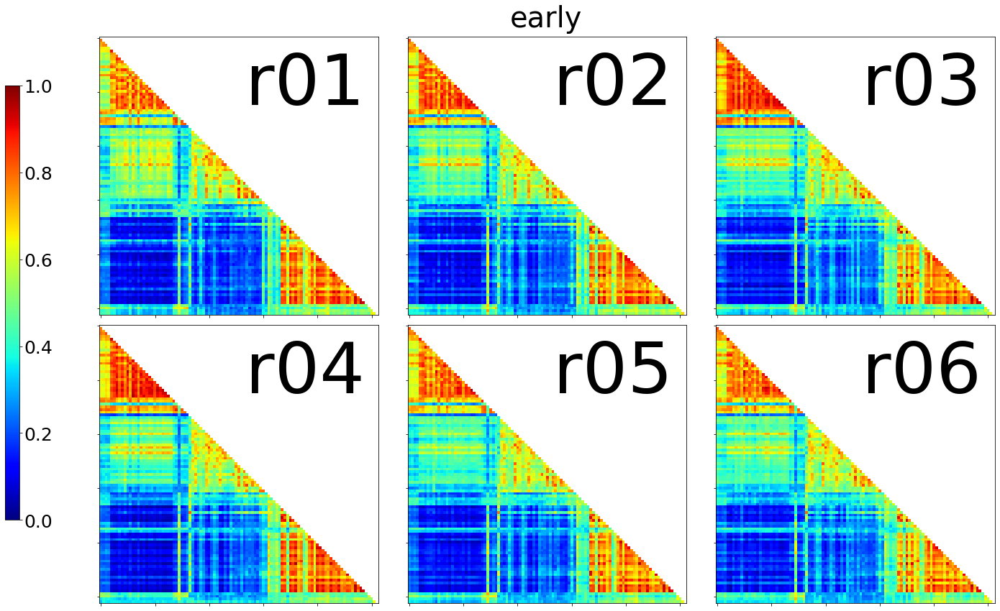

In [18]:
## GA
mean_MA_by_run = np.nanmean(allegiances[0], axis=0)

fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(18,12))
axs = np.concatenate(axs)

for r, run in enumerate(list_run):
    ax = axs[r]
    img = nplt.plot_matrix(
        mat=mean_MA_by_run[r]
        , tri='lower'
        , cmap='jet', vmax=1, vmin=0., colorbar=False
        , axes=ax
        , title=run
    )
fig.suptitle('early', size=40)

cax = fig.add_axes([-.08, .15, .015, .7])
cbar = fig.colorbar(img, cax=cax)
cbar.ax.tick_params(labelsize=25)

fig.tight_layout()

/tmp/ipykernel_48588/15322953.py:2: RuntimeWarning: Mean of empty slice
  mean_MA_by_run = np.nanmean(allegiances[1], axis=0)
/tmp/ipykernel_48588/15322953.py:22: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


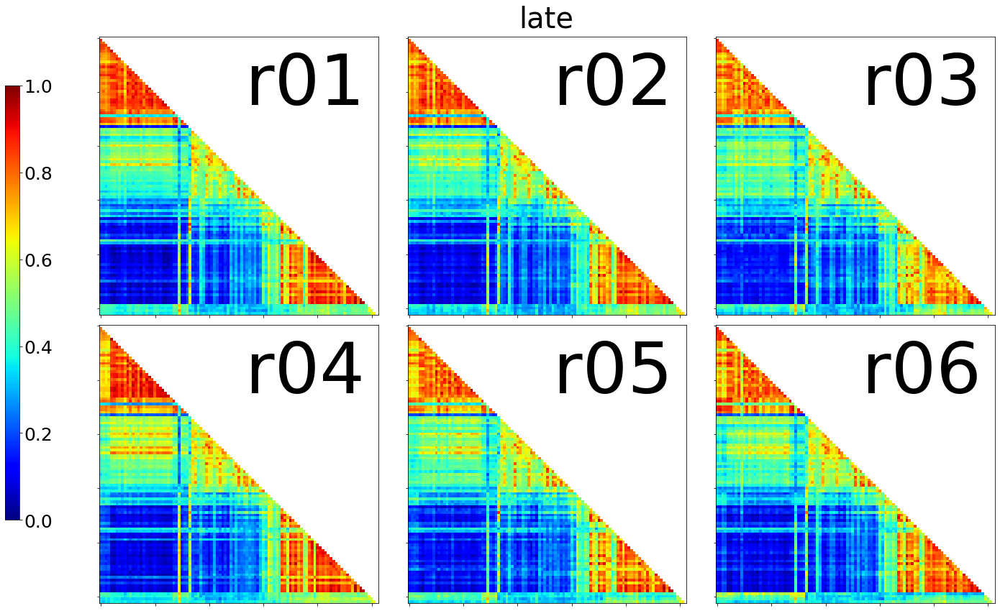

In [19]:
## GB
mean_MA_by_run = np.nanmean(allegiances[1], axis=0)

fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(18,12))
axs = np.concatenate(axs)

for r, run in enumerate(list_run):
    ax = axs[r]
    img = nplt.plot_matrix(
        mat=mean_MA_by_run[r]
        , tri='lower'
        , cmap='jet', vmax=1, vmin=0., colorbar=False
        , axes=ax
        , title=run
    )
fig.suptitle('late', size=40)

cax = fig.add_axes([-.08, .15, .015, .7])
cbar = fig.colorbar(img, cax=cax)
cbar.ax.tick_params(labelsize=25)

fig.tight_layout()

/tmp/ipykernel_48588/1433346425.py:2: RuntimeWarning: Mean of empty slice
  mean_MA_by_run = np.nanmean(allegiances[0]-allegiances[1], axis=0)
/tmp/ipykernel_48588/1433346425.py:22: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


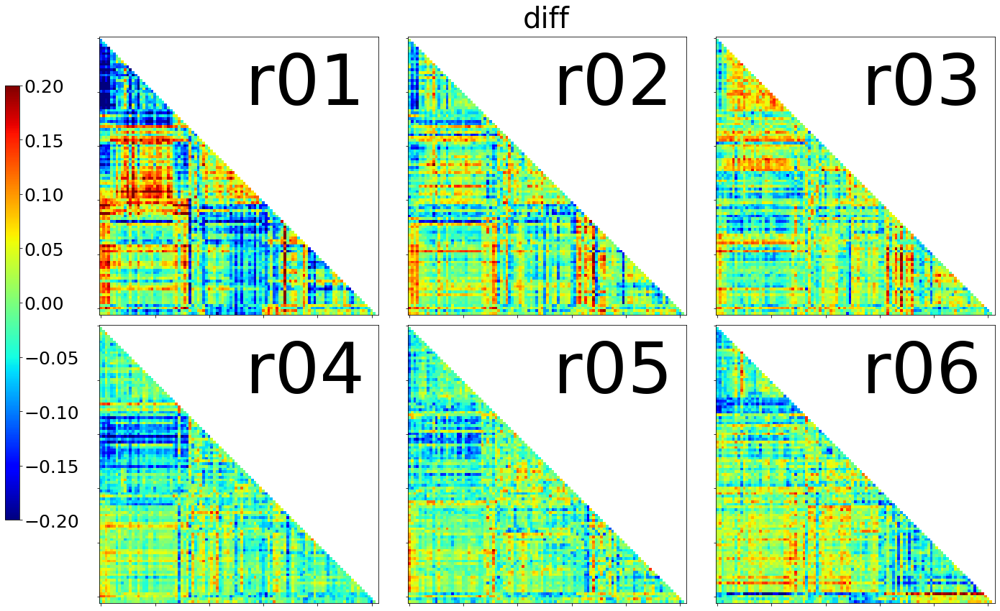

In [20]:
## GB - GA
mean_MA_by_run = np.nanmean(allegiances[0]-allegiances[1], axis=0)

fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(18,12))
axs = np.concatenate(axs)

for r, run in enumerate(list_run):
    ax = axs[r]
    img = nplt.plot_matrix(
        mat=mean_MA_by_run[r]
        , tri='lower'
        , cmap='jet', vmax=.2, vmin=-.2, colorbar=False
        , axes=ax
        , title=run
    )
fig.suptitle('diff', size=40)

cax = fig.add_axes([-.08, .15, .015, .7])
cbar = fig.colorbar(img, cax=cax)
cbar.ax.tick_params(labelsize=25)

fig.tight_layout()

/tmp/ipykernel_48588/1945339067.py:14: RuntimeWarning: Mean of empty slice
  matrix = np.nanmean(allegiances[i,:,:3], axis=(0,1))
/tmp/ipykernel_48588/1945339067.py:9: RuntimeWarning: Mean of empty slice
  matrix = np.nanmean(allegiances[1,:,:3]-allegiances[0,:,:3], axis=(0,1))
/tmp/ipykernel_48588/1945339067.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


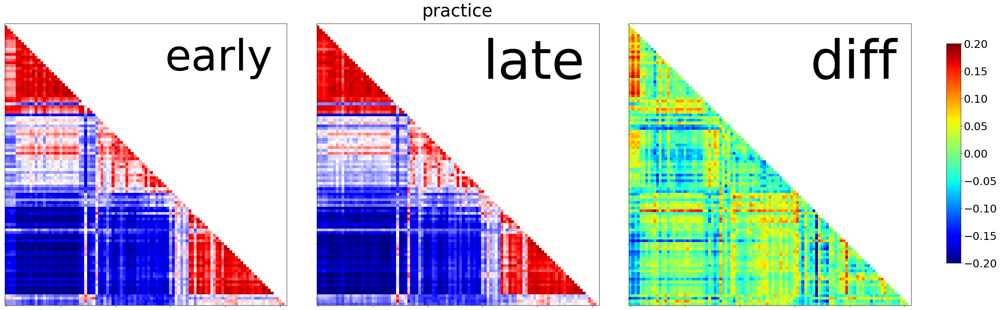

In [21]:
## practice
nrows = 1
ncols = 3
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*10, nrows*10))

for i, visit in enumerate(['early', 'late', 'diff']):
    ax = axs[i]
    if visit == 'diff':
        matrix = np.nanmean(allegiances[1,:,:3]-allegiances[0,:,:3], axis=(0,1))
        cmap='jet'
        vmax, vmin = .2, -.2
    else:
        ## GA or GB 30명, Run r01-r03 3개에 대한 평균
        matrix = np.nanmean(allegiances[i,:,:3], axis=(0,1))
        cmap='seismic'
        vmax, vmin = 1., 0.
    img = nplt.plot_matrix(
        matrix
        , vmax=vmax, vmin=vmin
        , tri='lower', title=visit
        , cmap=cmap, colorbar=False, axes=ax
    )
cax = fig.add_axes([1.02, .15, .015, .7])
cbar = fig.colorbar(img, cax=cax)
cbar.ax.tick_params(labelsize=25)

fig.suptitle('practice', size=40)
fig.tight_layout()

/tmp/ipykernel_48588/955022808.py:14: RuntimeWarning: Mean of empty slice
  matrix = np.nanmean(allegiances[i,:,3:], axis=(0,1))
/tmp/ipykernel_48588/955022808.py:9: RuntimeWarning: Mean of empty slice
  matrix = np.nanmean(allegiances[1,:,3:]-allegiances[0,:,3:], axis=(0,1))
/tmp/ipykernel_48588/955022808.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


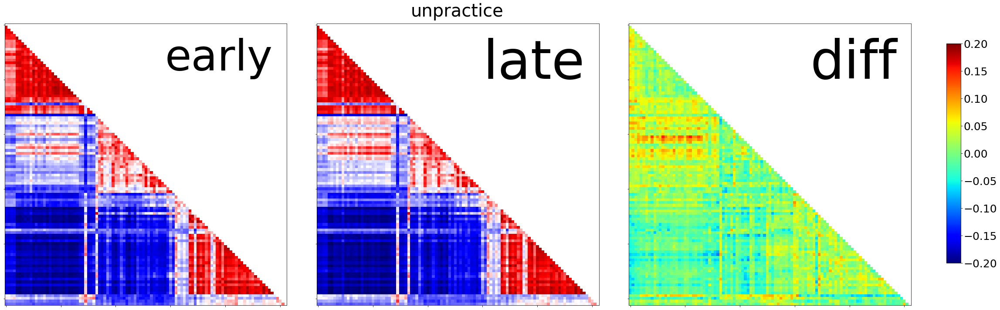

In [22]:
## unpractice
nrows = 1
ncols = 3
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*10, nrows*10))

for i, visit in enumerate(['early', 'late', 'diff']):
    ax = axs[i]
    if visit == 'diff':
        matrix = np.nanmean(allegiances[1,:,3:]-allegiances[0,:,3:], axis=(0,1))
        cmap='jet'
        vmax, vmin = .2, -.2
    else:
        ## GA or GB 30명, Run r04-r06 3개에 대한 평균
        matrix = np.nanmean(allegiances[i,:,3:], axis=(0,1))
        cmap='seismic'
        vmax, vmin = 1., 0.
    img = nplt.plot_matrix(
        matrix
        , vmax=vmax, vmin=vmin
        , tri='lower', title=visit
        , cmap=cmap, colorbar=False, axes=ax
    )
cax = fig.add_axes([1.02, .15, .015, .7])
cbar = fig.colorbar(img, cax=cax)
cbar.ax.tick_params(labelsize=25)

fig.suptitle('unpractice', size=40)
fig.tight_layout()

### ⅲ) Integration and Recruitment

In [23]:
## Recruitment, 2 days, 30 subjects, 6 runs, 3 networks
R = np.ones((2,30,6,3)) * np.nan

networks = np.unique(staticcommunity)
for vv, visit in enumerate(['early', 'late']):
    for ss, subj in enumerate(list_subj):
        for rr, run in enumerate(list_run):
            recruitment = calc_recruitment(allegiances[vv,ss,rr], staticcommunity)
            for nn, network in enumerate(networks):
                R[vv,ss,rr,nn] = np.mean(recruitment[staticcommunity==network])

/tmp/ipykernel_48588/2064154310.py:19: RuntimeWarning: Mean of empty slice
  recruitment[node] = np.nanmean(A[node, S==network])


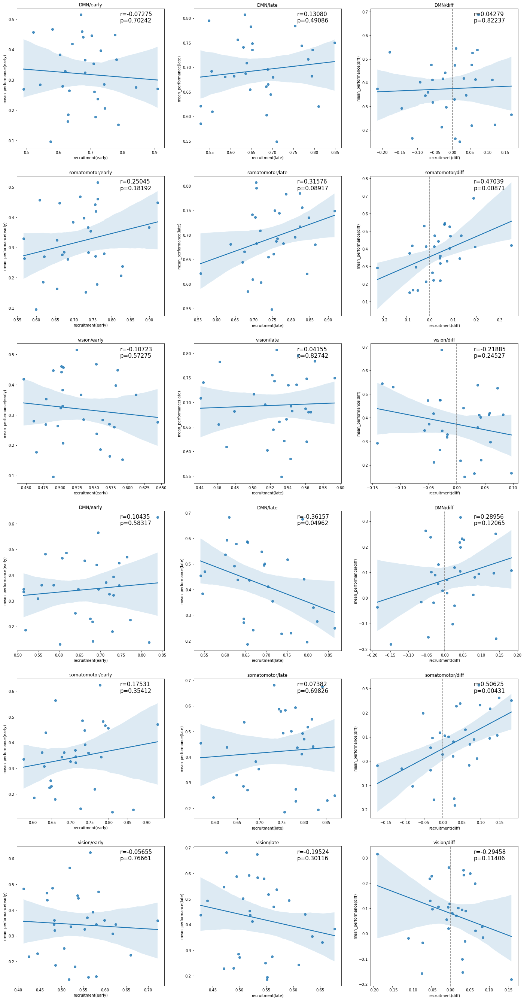

In [24]:
fig, axs = plt.subplots(nrows=3*2, ncols=3, figsize=(3*8, 3*2*8))

for mm, mapping in enumerate(['practice', 'unpractice']):
    mean_performance = np.nanmean(performance[:,:,3*mm:3*(mm+1)], axis=2)
    mean_R = np.nanmean(R[:,:,3*mm:3*(mm+1)], axis=2)
    for ii, network in enumerate(np.unique(staticcommunity)):
        row = 3*mm + ii
        idx = staticcommunity==network
        for col, visit in enumerate(['early', 'late', 'diff']):
            ax = axs[row,col]
            if visit == 'diff':
                x = mean_R[1,:,ii] - mean_R[0,:,ii]
                y = mean_performance[1,:] - mean_performance[0,:]
            else:
                x = mean_R[col,:,ii]
                y = mean_performance[col,:]

            X = x[~np.isnan(x)]
            Y = y[~np.isnan(x)]
            r, p = scipy.stats.pearsonr(X,Y)
            img = sns.regplot(
                x=X, y=Y, ax=ax
                , x_ci='ci'
            )
            img.set(
                title='%s/%s'%(network, visit)
                , xlabel='recruitment(%s)'%visit, ylabel='mean_performance(%s)'%visit
            )
            x0, x1 = img.get_xlim()
            y0, y1 = img.get_ylim()
            img.text(x0+(x1-x0)*.7, y0+(y1-y0)*.9, s='r=%.5f\np=%.5f'%(r,p), fontsize=15)
            if x0<=0 and x1>=0:
                ax.axvline(x=0, color='gray', linestyle='--')

In [25]:
## Integration, 2 days, 30 subjects, 6 runs, 3 networks
I = np.ones((2,30,6,3)) * np.nan

networks = np.unique(staticcommunity)
for vv, visit in enumerate(['early', 'late']):
    for ss, subj in enumerate(list_subj):
        for rr, run in enumerate(list_run):
            integration = calc_integration(allegiances[vv,ss,rr], staticcommunity)
            for nn, network in enumerate(networks):
                I[vv,ss,rr,nn] = np.mean(integration[staticcommunity==network])

/tmp/ipykernel_48588/1015756446.py:19: RuntimeWarning: Mean of empty slice
  integration[node] = np.nanmean(A[node, S!=network])


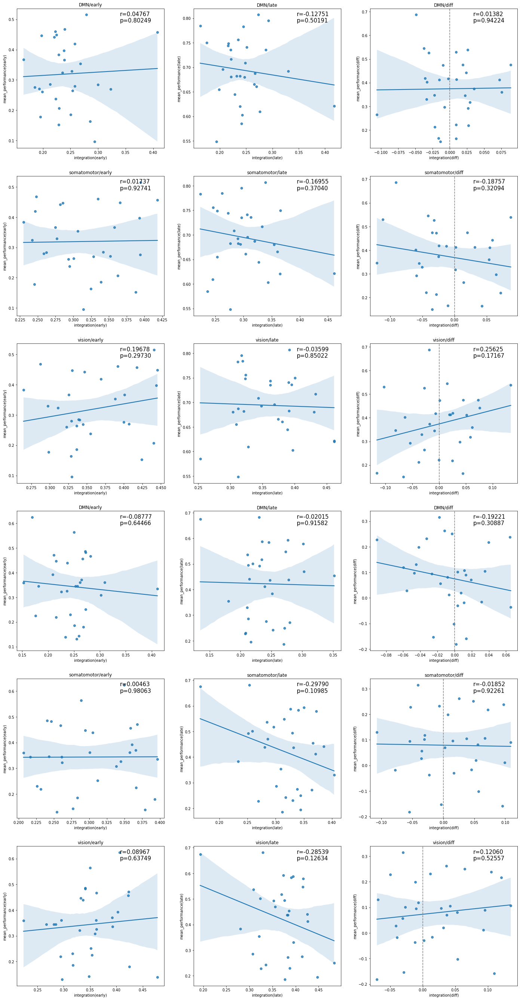

In [26]:
fig, axs = plt.subplots(nrows=3*2, ncols=3, figsize=(3*8, 3*2*8))

for mm, mapping in enumerate(['practice', 'unpractice']):
    mean_performance = np.nanmean(performance[:,:,3*mm:3*(mm+1)], axis=2)
    mean_I = np.nanmean(I[:,:,3*mm:3*(mm+1)], axis=2)
    for ii, network in enumerate(np.unique(staticcommunity)):
        row = 3*mm + ii
        idx = staticcommunity==network
        for col, visit in enumerate(['early', 'late', 'diff']):
            ax = axs[row,col]
            if visit == 'diff':
                x = mean_I[1,:,ii] - mean_I[0,:,ii]
                y = mean_performance[1,:] - mean_performance[0,:]
            else:
                x = mean_I[col,:,ii]
                y = mean_performance[col,:]

            X = x[~np.isnan(x)]
            Y = y[~np.isnan(x)]
            r, p = scipy.stats.pearsonr(X,Y)
            img = sns.regplot(
                x=X, y=Y, ax=ax
                , x_ci='ci'
            )
            img.set(
                title='%s/%s'%(network, visit)
                , xlabel='integration(%s)'%visit, ylabel='mean_performance(%s)'%visit
            )
            x0, x1 = img.get_xlim()
            y0, y1 = img.get_ylim()
            img.text(x0+(x1-x0)*.7, y0+(y1-y0)*.9, s='r=%.5f\np=%.5f'%(r,p), fontsize=15)
            if x0<=0 and x1>=0:
                ax.axvline(x=0, color='gray', linestyle='--')

---

In [51]:
recruitment = {}
integration = {}

for stage, MA in mean_MA_by_vvrr.items():
    nnodes = MA.shape[0]
    
    recruitment[stage] = np.zeros(nnodes)
    integration[stage] = np.zeros(nnodes)
    
    for node, system in enumerate(staticcommunity):
        recruitment[stage][node] = np.nanmean(MA[node,staticcommunity==system], axis=0)
        integration[stage][node] = np.nanmean(MA[node,staticcommunity!=system], axis=0)

In [30]:
df_r = pd.DataFrame.from_dict(recruitment, dtype=float)
sys_i = np.concatenate([staticcommunity for stage in df_r.columns])

df_r = pd.melt(df_r)
df_r['w/i network'] = sys_i
df_r['metric'] = 'recruitment'
df_r

,variable,value,w/i network,metric
0,early_r01,0.650651,somatomotor,recruitment
1,early_r01,0.625911,somatomotor,recruitment
2,early_r01,0.608984,somatomotor,recruitment
3,early_r01,0.629948,somatomotor,recruitment
4,early_r01,0.713802,somatomotor,recruitment
...,...,...,...,...
613,late_r03,0.790357,DMN,recruitment
614,late_r03,0.391310,DMN,recruitment
615,late_r03,0.447500,DMN,recruitment
616,late_r03,0.530595,DMN,recruitment


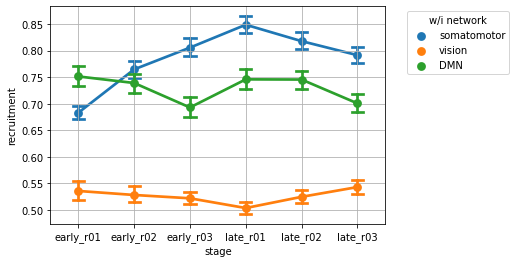

In [31]:
g = sns.pointplot(
    data=df_r, x='variable', y='value', hue='w/i network'
    , capsize=.2, ci=68
)
g.set(xlabel='stage', ylabel='recruitment')
g.grid(True)
g.legend(bbox_to_anchor=(1.05, 1.0), title='w/i network')

In [32]:
df_i = pd.DataFrame.from_dict(integration, dtype=float)
sys_i = np.concatenate([staticcommunity for stage in df_i.columns])

df_i = pd.melt(df_i)
df_i['w/o network'] = sys_i
df_i['metric'] = 'integration'
df_i

,variable,value,w/o network,metric
0,early_r01,0.244167,somatomotor,integration
1,early_r01,0.249702,somatomotor,integration
2,early_r01,0.250417,somatomotor,integration
3,early_r01,0.248274,somatomotor,integration
4,early_r01,0.263690,somatomotor,integration
...,...,...,...,...
613,late_r03,0.136754,DMN,integration
614,late_r03,0.412500,DMN,integration
615,late_r03,0.367413,DMN,integration
616,late_r03,0.325311,DMN,integration


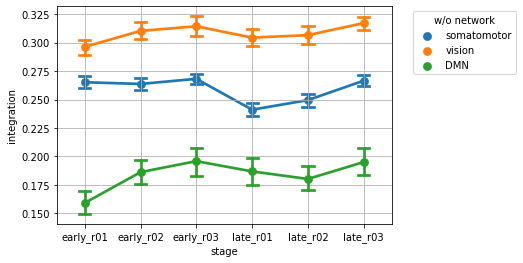

In [33]:
g = sns.pointplot(
    data=df_i, x='variable', y='value', hue='w/o network'
    , capsize=.2, ci=68
)
g.set(xlabel='stage', ylabel='integration')
g.grid(True)
g.legend(bbox_to_anchor=(1.05, 1.0), title='w/o network')

In [34]:
df = pd.concat([df_r, df_i])
df = df.reset_index(drop=True)
df

,variable,value,w/i network,metric,w/o network
0,early_r01,0.650651,somatomotor,recruitment,NaN
1,early_r01,0.625911,somatomotor,recruitment,NaN
2,early_r01,0.608984,somatomotor,recruitment,NaN
3,early_r01,0.629948,somatomotor,recruitment,NaN
4,early_r01,0.713802,somatomotor,recruitment,NaN
...,...,...,...,...,...
1231,late_r03,0.136754,NaN,integration,DMN
1232,late_r03,0.412500,NaN,integration,DMN
1233,late_r03,0.367413,NaN,integration,DMN
1234,late_r03,0.325311,NaN,integration,DMN


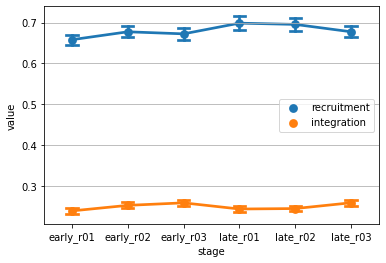

In [35]:
g = sns.pointplot(
    data=df, x='variable', y='value', hue='metric'
    , capsize=.2, ci=68
)
g.grid(True, which='major', axis='y')
g.set(xlabel='stage')
g.legend()

---